<a href="https://colab.research.google.com/github/kashishthakur26/Dog_breed_identification_using_Tensorflow/blob/main/dog_breed_identification_using_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !unzip "drive/My Drive/Colab Notebooks/dog-vision/dog-breed-identification.zip" -d "drive/My Drive/Colab Notebooks/dog-vision/"

### Get the workspace ready

In [2]:
import tensorflow_hub as hub
import tensorflow as tf
print("TF version:",tf.__version__)
print("TF hub version:",hub.__version__)

# check for gpu availability

print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available :)")


TF version: 2.12.0
TF hub version: 0.13.0
GPU available


## Getting data ready

In [3]:
import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

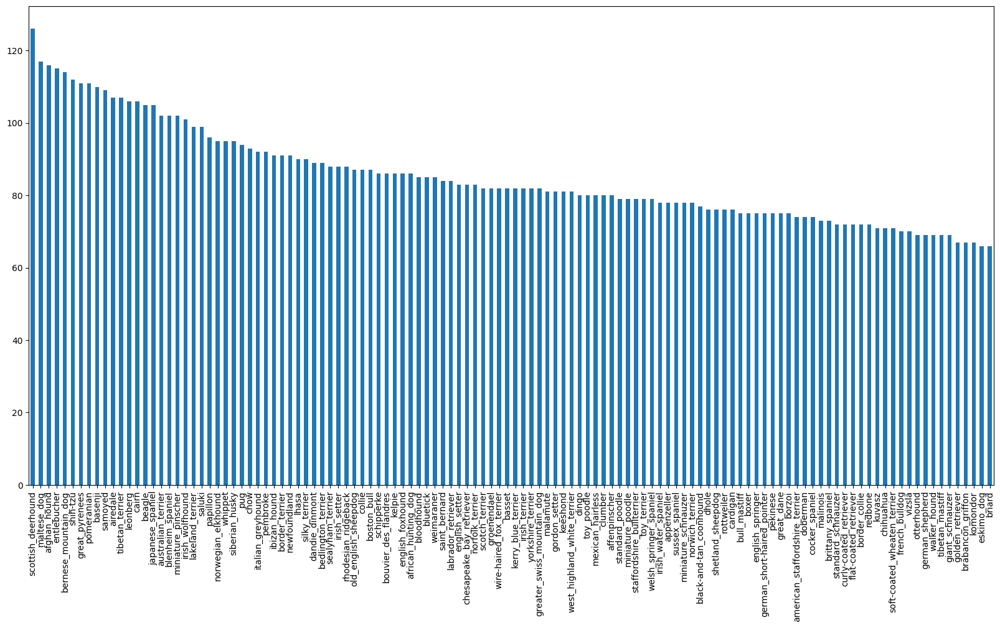

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

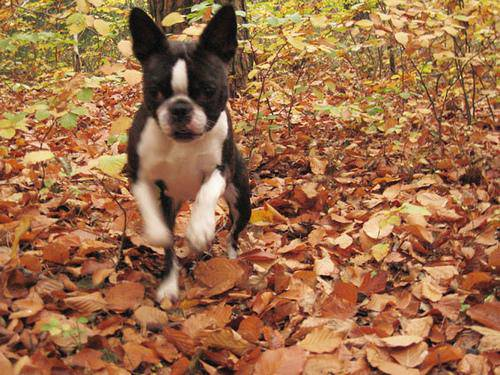

In [6]:
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels
Let's get a list of all our images file pathnames

In [7]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [8]:
filenames = [fname for fname in labels_csv["id"]]
filenames

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [9]:
filenames = ["drive/MyDrive/Colab Notebooks/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [10]:
filenames[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")

else:
  print("Shit Man!!!!")

Filenames match actual amount of files!!! Proceed.


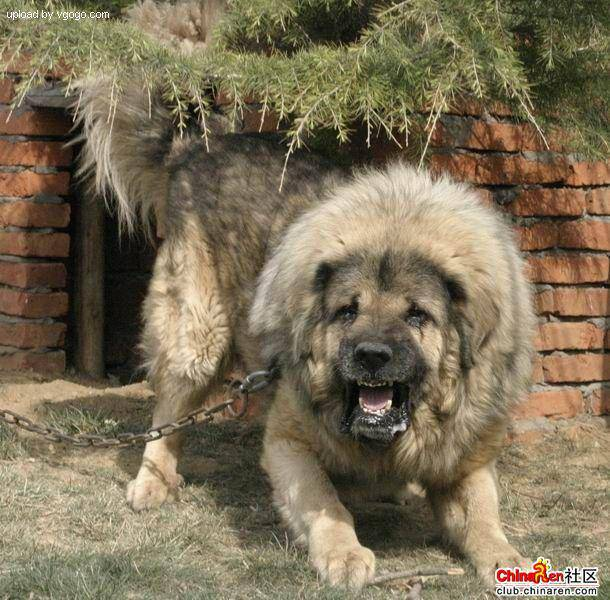

In [12]:
Image(filenames[9000])

since we've now got our training image filepaths in a list,lets prepare our labels.

In [13]:
import numpy as np
labels= labels_csv["breed"].to_numpy()
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)
unique_breeds = np.unique(labels)
len(unique_breeds)
unique_breeds.shape

(120,)

In [15]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
# example : turning boolean array into integers
print(boolean_labels[2].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creatin gour own validation set
Since the dataset from kaggel does'nt come with a validation set, we're going to create our own.

In [18]:
x= filenames
y = boolean_labels
len(filenames)

10222

we're going to start off experimenting with ~1000 images and increase as needed.

In [19]:
num_images = 1000


In [20]:
from sklearn.model_selection import train_test_split

np.random.seed(42)

x_train,y_train,y_train,y_test = train_test_split(x[:num_images],
                                                  y[:num_images],
                                                  test_size=0.2,
                                                  random_state=42
                                                  )

### Pre-proessing Images(turning images into Tenses)

To preprocess our inages into tensors we're gooing to write a function which does few things:

1. Take image filepath as input.
2. Use Tensorflow to read the file and save it to a variable, 'image'.
3. Turn our 'image' (a jpg) into tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224,224).
6. Return the modified 'image'.

In [21]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [23]:
# converting image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [24]:
# define image size
img_size = 224

def process_image(image_path):
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical tensor with 3 color channels(read,green,blue)
  image= tf.image.decode_jpeg(image , channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image= tf.image.convert_image_dtype(image, tf.float32)
  #resize the image to 224
  image = tf.image.resize(image, size=[img_size,img_size])
  
  return image

### Turning our data into batch size

why to turn our data into batches?

ans: if we're tring to process 10000+ images in one go...
they all might not fit into memory.

In [25]:
# create a function to return a tuple(image,label)

def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

### Let's make a function to turn all data of our data(x & y) into batches

In [26]:
Batch_size = 32

# create a fucntion to turn data inot batch

def create_data_batches(x,y=None, batch_size=Batch_size,valid_data=False , test_data=False):
  if test_data:
    print("Creating test data batch")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print("Creating validation data batch")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data becomes...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y) ))  
    data= data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)
    return data_batch 

In [27]:
# creating training and validation data
train_data  =  create_data_batches(x_train,y_train)
val_data = create_data_batches(x_train,y_train,valid_data=True)

Creating training data becomes...
Creating validation data batch


In [28]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### visualizing data batches

In [29]:
import matplotlib.pyplot as plt

def show_25_image(images,labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax= plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [30]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images) , len(train_labels)

(32, 32)

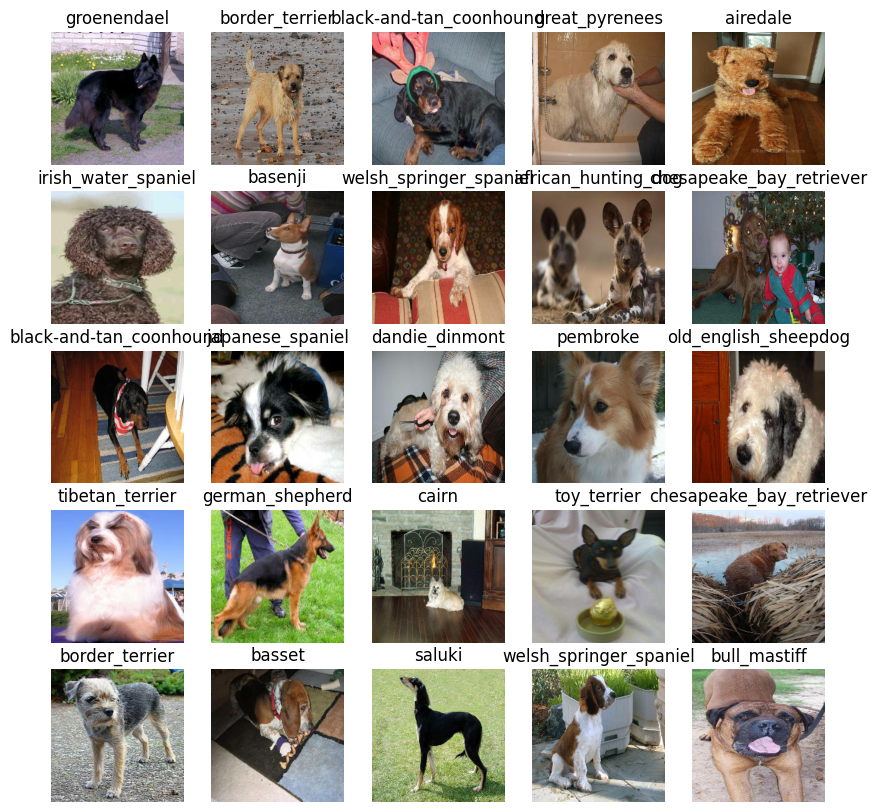

In [31]:
show_25_image(train_images , train_labels)

### Building a model
Before we build a model, there are a few things we need to defne:
* The input shape(our images shape, in the form of tensors) to our model_selection.
* The output shape(image labels,in the form of Tensors) of our model.
* The URL of the model we want to use.

In [32]:
# setup input shape to the model 
INPUT_SHAPE =[None,img_size,img_size,3]

OUTPUT_SHAPE = len(unique_breeds)

#setup model url from tensorflow hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5"



In [33]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

## Creating callback

In [34]:
%load_ext tensorboard

In [35]:
import datetime

def create_tensorboard_callback():
  logdir= os.path.join("/drive/MyDrive/Colab Notebooks/dog-vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

In [36]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model

In [37]:
NUM_EPOCHS=100

In [38]:
def train_model():
  model=create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  return model


In [39]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5
Epoch 1/100
25/25 [==============================] - 134s 5s/step - loss: 4.8605 - accuracy: 0.0712 - val_loss: 2.3628 - val_accuracy: 0.4425
Epoch 2/100
25/25 [==============================] - 5s 203ms/step - loss: 1.7456 - accuracy: 0.5850 - val_loss: 0.8170 - val_accuracy: 0.8788
Epoch 3/100
25/25 [==============================] - 5s 207ms/step - loss: 0.6724 - accuracy: 0.9150 - val_loss: 0.3491 - val_accuracy: 0.9825
Epoch 4/100
25/25 [==============================] - 8s 311ms/step - loss: 0.3078 - accuracy: 0.9837 - val_loss: 0.1833 - val_accuracy: 0.9962
Epoch 5/100
25/25 [==============================] - 5s 197ms/step - loss: 0.1699 - accuracy: 0.9962 - val_loss: 0.1185 - val_accuracy: 1.0000
Epoch 6/100
25/25 [==============================] - 5s 205ms/step - loss: 0.1120 - accuracy: 1.0000 - val_loss: 0.0866 - val_accuracy: 1.0000
Epoch 7/100
25/25 [==============================]

In [40]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/dog-vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [41]:
predictions = model.predict(val_data, verbose=1)
predictions

25/25 [==============================] - 3s 88ms/step


array([[1.3537807e-04, 6.9754075e-05, 9.0617630e-07, ..., 5.8197602e-06,
        1.5769843e-05, 9.6254844e-05],
       [3.0703258e-03, 7.1360532e-04, 4.4366216e-06, ..., 4.6791297e-06,
        6.5933877e-05, 1.1169047e-05],
       [6.8185764e-05, 1.3409015e-05, 5.0576436e-09, ..., 4.3544906e-06,
        9.6963628e-09, 3.3120337e-04],
       ...,
       [1.5275228e-04, 9.5846772e-04, 3.3094537e-05, ..., 1.0002880e-05,
        1.4627199e-05, 2.2372093e-05],
       [2.4523301e-06, 8.9070796e-05, 7.1697872e-07, ..., 1.0564953e-05,
        4.0568339e-05, 1.0557018e-03],
       [2.3819105e-06, 6.5010986e-06, 1.5663456e-05, ..., 4.4417352e-04,
        1.7442566e-03, 1.7172930e-05]], dtype=float32)

In [42]:
#first predictions
index=42

print(predictions[index])
print(f"max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.23574386e-06 5.81814093e-05 3.15677971e-05 5.01639943e-06
 8.60364584e-04 5.93163440e-06 8.96264901e-05 1.29234259e-05
 1.59594507e-04 1.62761862e-05 7.33652851e-05 3.40008468e-04
 6.44757665e-06 3.78521436e-05 3.67337518e-04 7.67940037e-06
 1.87158250e-07 2.86109908e-03 7.43434430e-05 5.06423006e-04
 2.46319019e-06 7.52019871e-04 1.11212212e-05 1.49176458e-05
 9.51788388e-06 2.74403410e-05 6.51691621e-03 1.30664266e-05
 7.13565329e-04 5.21942333e-04 2.53139169e-05 6.18602353e-05
 1.21051953e-05 5.12669885e-06 5.39062348e-05 1.59444811e-04
 1.92824763e-03 4.62865719e-05 2.33261994e-06 4.14317037e-05
 1.84740247e-06 2.89189956e-07 3.25581903e-04 6.35734323e-05
 1.13233409e-05 2.40457885e-05 7.19280479e-06 1.81126707e-05
 2.15695877e-06 2.03469396e-03 2.47705011e-05 2.79433389e-05
 4.29873075e-03 1.02310835e-07 3.05875437e-05 3.41570936e-04
 2.53011414e-04 3.64107662e-04 7.13101035e-05 1.02261768e-03
 7.42198608e-04 1.09286366e-05 2.08201891e-04 4.08130982e-05
 8.13661336e-06 7.067365

In [43]:
unique_breeds[20]

'bouvier_des_flandres'

Note: Prediction probabilities are also known as confidence levels.

In [44]:
def get_preds_label(predictions_probabilities):

  return unique_breeds[np.argmax(predictions_probabilities)]

pred_label = get_preds_label(predictions[81
                                         ])
pred_label

'doberman'

In [45]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions on the validation images and the compare those predictions to the validations labels(turn labels.)

In [46]:
# create a function to unbatch a batch dataset

def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)]
)

  return images,labels

val_images, val_labels = unbatchify(val_data)

  
    

In [47]:
images_ = []
labels =[]

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels.append(label)

In [48]:
get_preds_label(labels[0])


'cairn'

In [49]:
get_preds_label(predictions[0])

'cairn'

Now we've got ways to get:
* prediction labels
* validation labels(truth tabels)
* validation images

Let's make some functions to make these all a bit more visualize.

we'll create a function which:

* Takes an array of prediction probabilities,an array of images and an integer.
* Convert the prediction probabilities to a predict label.
* Plot the predict label, its predicted probability th truth label and the target image on a single plot.

In [50]:
def plot_pred(predictions_probabilities,labels,images,n=1):
  pred_prob , true_label , image = predictions_probabilities[n] , labels[n] , images[n]
  pred_label = get_preds_label(pred_prob)

  #plot image and remove ticks

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

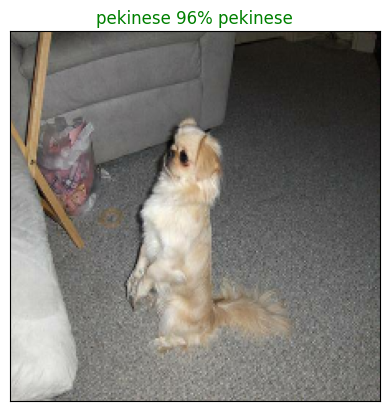

In [51]:
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images = val_images,n=25
          

          )

In [52]:
#let's make another to view our model top 10 predictions.

def plot_pred_conf(predictions_probabilities , labels , n=1):

  pred_prob , true_label = predictions_probabilities[n] , labels[n]
  pred_label = get_preds_label(pred_prob)
   
  #find the top 10 prediction confidence indexes 
  top_10_preds_indexes = pred_prob.argsort()[-10:][::-1]
  #find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_preds_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_preds_indexes]

  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass
             





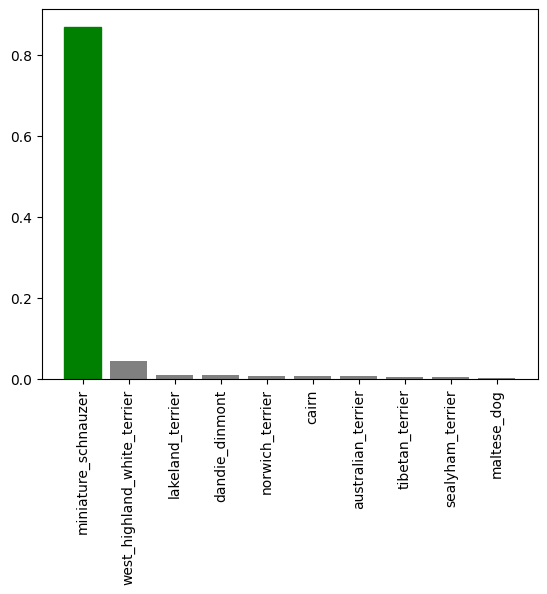

In [53]:
plot_pred_conf(predictions_probabilities=predictions,
               labels=val_labels,
               n=9)

visualizing our predictions and evaluate our model

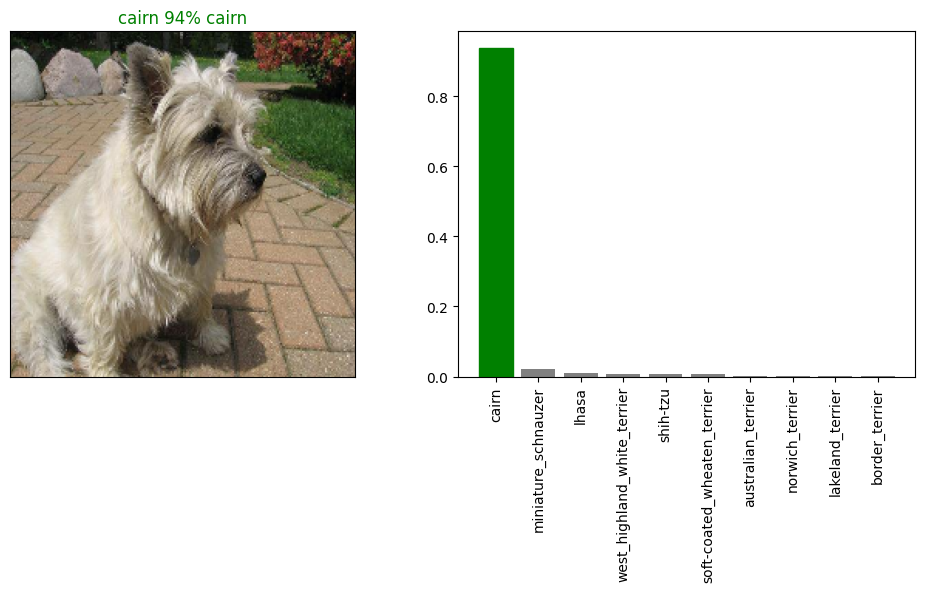

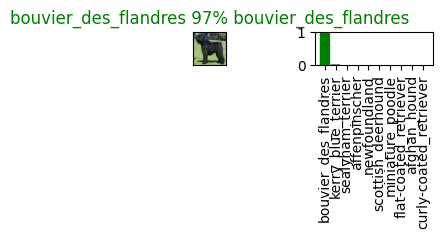

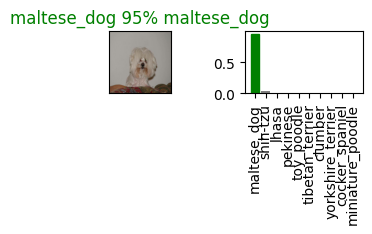

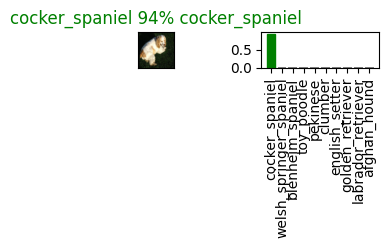

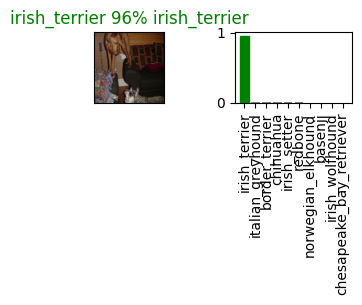

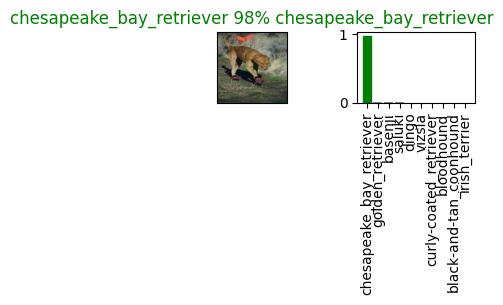

In [54]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols , 2*i+1)
  plot_pred(predictions_probabilities=predictions,
            labels=val_labels,
            images=val_images
            ,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(predictions_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=0.1)
  plt.show()





### saving and relaoding a trained model

In [55]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+"-" + suffix + ".h5"
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path


In [56]:
# creating a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from:{model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [57]:
#save our model traind on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")


Saving model to:drive/MyDrive/Colab Notebooks/dog-vision/models/20230512-05381683869894-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/dog-vision/models/20230512-05381683869894-1000-images-mobilenetv2-Adam.h5'

In [58]:
#load model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/dog-vision/models/20230417-17351681752912-1000-images-mobilenetv2-Adam.h5')


Loading saved model from:drive/MyDrive/Colab Notebooks/dog-vision/models/20230417-17351681752912-1000-images-mobilenetv2-Adam.h5


In [59]:
# Evaluate the pre-saved model
model.evaluate(val_data)

25/25 [==============================] - 2s 89ms/step - loss: 0.0552 - accuracy: 1.0000


[0.055215172469615936, 1.0]

In [60]:
loaded_1000_image_model.evaluate(val_data)

25/25 [==============================] - 3s 89ms/step - loss: 0.0698 - accuracy: 1.0000


[0.06979122012853622, 1.0]

In [61]:
#Training on full data
len(x),len(y)

(10222, 10222)

In [62]:
x[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [63]:
#making batch
full_data = create_data_batches(x,y)


Creating training data becomes...


In [64]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5


In [66]:
#create full model call backs
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [67]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 37s 102ms/step - loss: 1.8697 - accuracy: 0.5224
Epoch 2/100
320/320 [==============================] - 31s 98ms/step - loss: 0.7973 - accuracy: 0.7602
Epoch 3/100
320/320 [==============================] - 31s 98ms/step - loss: 0.5611 - accuracy: 0.8274
Epoch 4/100
320/320 [==============================] - 33s 102ms/step - loss: 0.4064 - accuracy: 0.8761
Epoch 5/100
320/320 [==============================] - 32s 100ms/step - loss: 0.3126 - accuracy: 0.9093
Epoch 6/100
320/320 [==============================] - 32s 100ms/step - loss: 0.2339 - accuracy: 0.9390
Epoch 7/100
320/320 [==============================] - 32s 99ms/step - loss: 0.1787 - accuracy: 0.9582
Epoch 8/100
320/320 [==============================] - 31s 97ms/step - loss: 0.1405 - accuracy: 0.9715
Epoch 9/100
320/320 [==============================] - 31s 97ms/step - loss: 0.1103 - accuracy: 0.9826
Epoch 10/100
151/320 [=============>................] - ETA: 16s - lo

KeyboardInterrupt: ignored

In [68]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")


Saving model to:drive/MyDrive/Colab Notebooks/dog-vision/models/20230512-05431683870235-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/dog-vision/models/20230512-05431683870235-full-image-set-mobilenetv2-Adam.h5'

In [69]:
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/dog-vision/models/20230417-18591681757955-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from:drive/MyDrive/Colab Notebooks/dog-vision/models/20230417-18591681757955-full-image-set-mobilenetv2-Adam.h5


## making predcitions to test data set


In [70]:
test_path = "drive/MyDrive/Colab Notebooks/dog-vision/test/"
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/test/e69416b277bf04ba83a5f3586fe12f9b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/de59703200e1b19b520033e76dea9b62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/df2d806debebfd39e858f877756518e8.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/de6cc38e54a460dd34c53b74f022a8da.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e43f6e621469f438f351d31d889b839f.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e6999e18a8e98f7fc33cf520d26ec521.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e63a126acd70223f2d388702843d185b.jpg']

In [71]:
len(test_filenames)

10331

In [72]:
test_data = create_data_batches(test_filenames , test_data=True)

Creating test data batch


In [73]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [74]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

323/323 [==============================] - 167s 502ms/step


In [75]:
#save predictions to csv file
np.savetxt("drive/MyDrive/Colab Notebooks/dog-vision/preds_array.csv", test_predictions , delimiter=",")


In [76]:
test_predictions = np.loadtxt("drive/MyDrive/Colab Notebooks/dog-vision/preds_array.csv",delimiter=",")

### preparing the kaggle samole submission(getting data in kaggle submission format)

To get the data in this format, we'll:

* Create a pandas dataframe with an ID column as well as a column fro each  dog breed.
*Add data to the ID column by extracting the test image ID's from their filepaths.
*Add data(the prediction probailities) to each of the dog breed columns.
*Export the DataFrame as acsv to submit it to kaggle.


In [77]:
# create a pandas DataFrame with empty
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [78]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [79]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e69416b277bf04ba83a5f3586fe12f9b,2.923768e-12,1.212213e-10,4.168733e-14,6.864757e-11,6.992166e-13,3.648959e-09,7.776148e-11,5.779524e-08,1.401719e-08,...,7.252650e-14,3.753793e-11,2.857946e-12,3.685811e-11,5.340548e-12,1.504027e-13,1.831599e-08,3.171227e-12,5.375295e-08,2.553983e-11
1,de59703200e1b19b520033e76dea9b62,1.841598e-12,3.454024e-12,3.540502e-09,3.336627e-11,3.675064e-05,5.740716e-07,3.768393e-08,1.120314e-08,2.122727e-07,...,4.221171e-13,2.263714e-07,2.668940e-09,3.995900e-09,1.565363e-09,3.057068e-16,5.671359e-10,2.181054e-02,4.495803e-10,3.624262e-07
2,e379ba26a5e2e22e85975b839e0e401b,9.867737e-14,4.293983e-21,2.036938e-16,3.147273e-17,3.855236e-10,5.001309e-10,4.079660e-14,3.135393e-07,2.143077e-19,...,1.266086e-17,9.999996e-01,6.060345e-19,7.569995e-15,5.436600e-21,6.696232e-17,2.071510e-13,1.182101e-14,3.438437e-12,2.930362e-16
3,de5496c6b58f66ab890ab24087d9e220,8.052424e-12,1.059150e-02,7.371158e-07,6.253850e-04,1.984727e-08,4.682689e-08,6.195786e-08,3.188543e-09,1.815632e-08,...,5.963085e-08,3.601352e-11,1.256601e-08,6.314513e-09,2.891002e-08,8.166835e-09,3.514830e-06,5.309450e-05,2.093346e-02,1.967340e-09
4,e7be7b911a4cba9fdfa4105ec4776370,7.328607e-06,2.286013e-08,1.008381e-10,2.672870e-12,1.658372e-09,5.064392e-09,1.301007e-07,1.465084e-08,3.201164e-10,...,2.110097e-10,7.642397e-11,5.129473e-11,5.902093e-12,7.538320e-11,3.592210e-14,1.773179e-07,1.551924e-08,7.279582e-08,1.620830e-06


In [80]:
# Save our predictions dataframe to csv for submission to kaggle 
preds_df.to_csv("drive/MyDrive/Colab Notebooks/dog-vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

### Making predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels, we set the test_data parameter to True.
*Pass the custom image data batch to our models predict() method.
* Convert the prediction output probabilities to prediction labelss.
* Compare the predicited labels to the custom images. 